### imports

In [1]:
import sys
import os
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Markdown, display

# Caminho da pasta "Twitch"
base_dir = Path(os.getcwd()).resolve().parent  # Ajuste se necessário
# Adicionar as pasta ao sys.path
visualization_dir = base_dir / 'src' / 'visualization'
getData_dir = base_dir / 'src' / 'data'
sys.path.append(str(visualization_dir))
sys.path.append(str(getData_dir))

# Importar os módulos
try:
    import allNodesRegions
    import studyRegion
    import TwitchGraphs
    import TwitchVisualization
except ImportError:
    print("Erro: Não foi possível importar algum módulo. Verifique se o caminho está correto.")

# Paises
countries = ["PTBR", "DE", "ENGB", "ES", "FR", "RU"]

# Configuração de estilo dos gráficos
TwitchGraphs.setup_style()

## Visualização de gráficos

### Definir parâmetros

#### Definir o diretório correto

#### Selecionar o País

In [2]:
# Escolher entre: DE, ENGB, ES, FR, PTBR, RU
country = "PTBR"

#### Variáveis Extras

In [3]:
# Definir o nome das ficheiros originais
Filedges = "musae_" + country + "_edges.csv"
Filetarget = "musae_" + country + "_target.csv"

# Definir o diretório dos ficheiros originais
edgePath = base_dir / 'data' / country / Filedges
targetPath = base_dir / 'data' / country / Filetarget

# Definir o diretório dos ficheiros tratados e do local das imagens
csv_path = base_dir / 'data' / country / 'processed_data'/ f"twitch_network_analysis_{country}.csv"
output_dir = base_dir / 'docs' / "Imagens"

# Ler o ficheiro CSV
df = pd.read_csv(csv_path)
df

,node,degree,avg_clustering,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,clustering_coef,louvain_community,...,profile_pic,broadcaster_type,game_name,GameType,day_of_year,is_leap,days_in_year,normalized_day,sin_created_at,cos_created_at
0,1706,82,0.319895,0.042909,0.431280,0.002360,0.018123,0.001325,0.104185,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,StarCraft II,Online,168.0,False,365,2.874772,0.263665,-0.964614
1,1273,8,0.319895,0.004186,0.370421,0.000007,0.003015,0.000181,0.321429,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,NaN,Non_Content_Available,109.0,False,365,1.859134,0.958718,-0.284359
2,313,16,0.319895,0.008373,0.418345,0.000003,0.013024,0.000269,0.608333,1,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Throne and Liberty,Online,17.0,False,365,0.275427,0.271958,0.962309
3,1570,8,0.319895,0.004186,0.417249,0.000056,0.004507,0.000190,0.285714,2,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,FINAL FANTASY XIV ONLINE,Online,109.0,True,366,1.854055,0.960150,-0.279486
4,800,2,0.319895,0.001047,0.320530,0.000005,0.000322,0.000113,0.000000,6,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,Dengeki Bunko: Fighting Climax Ignition,Online,7.0,False,365,0.103285,0.103102,0.994671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1907,699,31,0.319895,0.016222,0.437400,0.000527,0.020704,0.000507,0.350538,1,...,https://static-cdn.jtvnw.net/user-default-pict...,affiliate,League of Legends,Online,259.0,True,366,4.429131,-0.960150,-0.279486
1908,109,37,0.319895,0.019362,0.435506,0.000332,0.017012,0.000580,0.339339,4,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,partner,Just Chatting,Non-Videogame,244.0,True,366,4.171623,-0.857315,-0.514793
1909,769,120,0.319895,0.062794,0.479188,0.004164,0.043742,0.001691,0.187675,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,partner,Crypto,Non-Videogame,311.0,False,365,5.336404,-0.811539,0.584298
1910,504,124,0.319895,0.064887,0.486260,0.002614,0.057477,0.001666,0.228691,4,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,partner,Just Chatting,Non-Videogame,62.0,False,365,1.050067,0.867456,0.497513


#### Configurar o estilo dos gráficos

### Visualização dos Grafos

Não foi possível carregar a imagem para nan: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


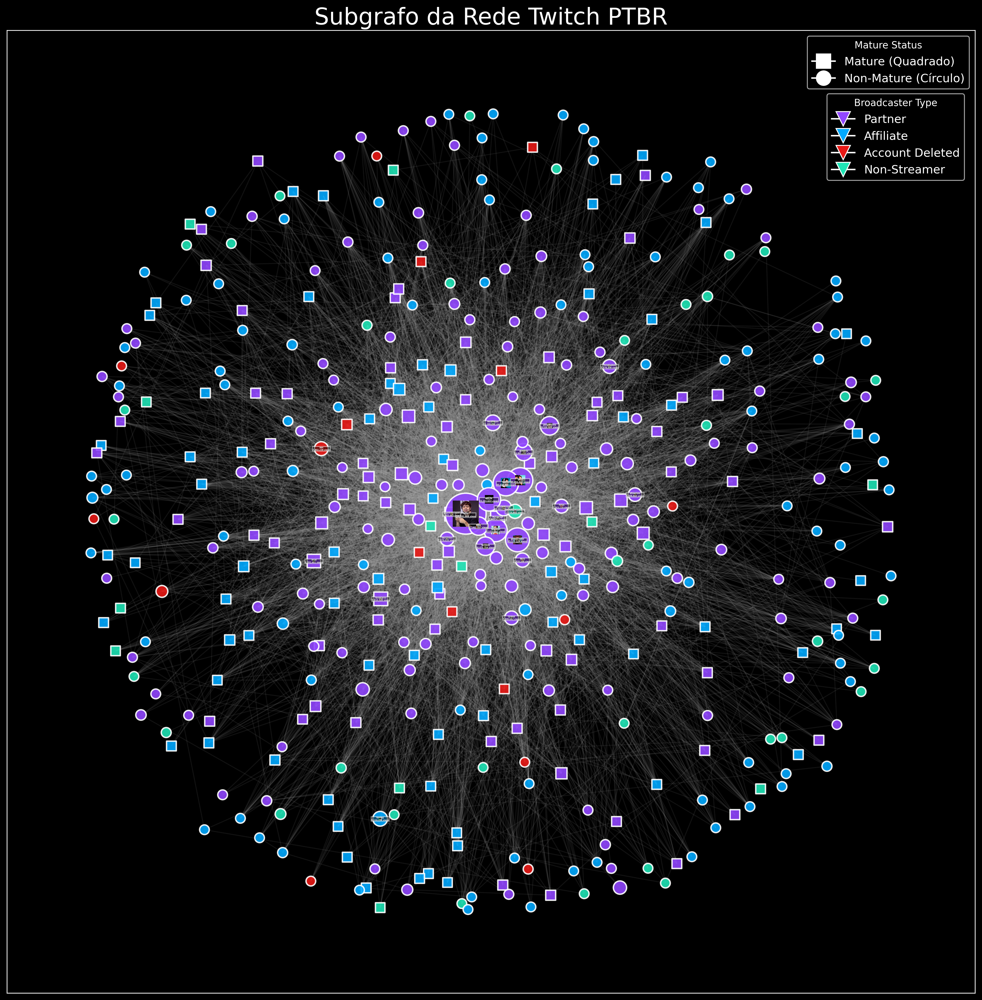

In [4]:
# Definir a percentagem de nós do grafo a utilizar
PercNodes = 10
TwitchVisualization.seeGraph(base_dir, edgePath, csv_path, PercNodes, country)

### Histograma das Variáveis

In [5]:
output_dir_hist = base_dir / 'docs' / "Imagens"
hist_folder = TwitchGraphs.create_subfolder('Histograms', output_dir_hist)

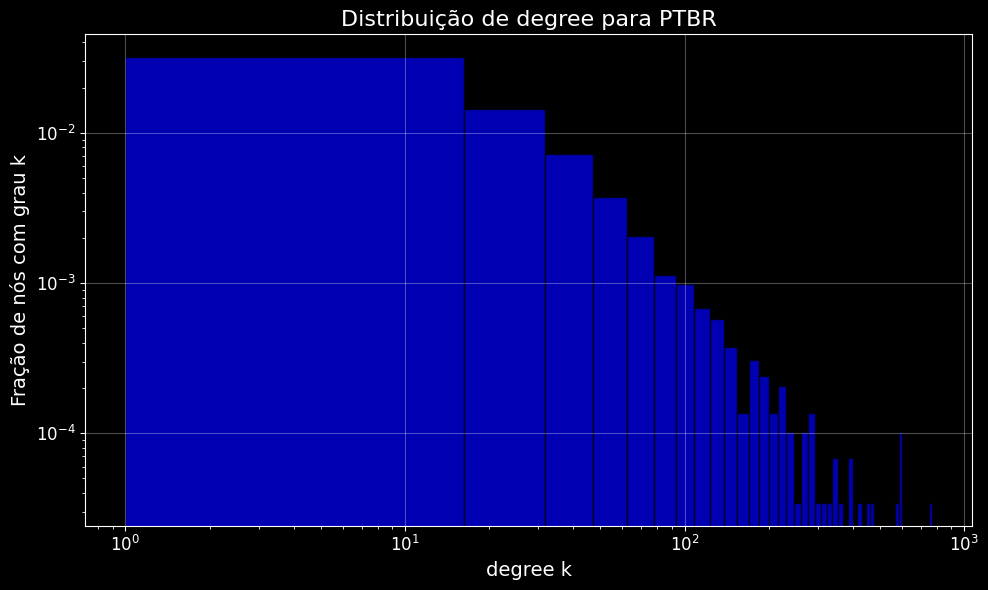

In [6]:
TwitchGraphs.plot_histogram(df = df, column_name = 'degree', color = 'blue', country = country, output_dir = output_dir_hist)

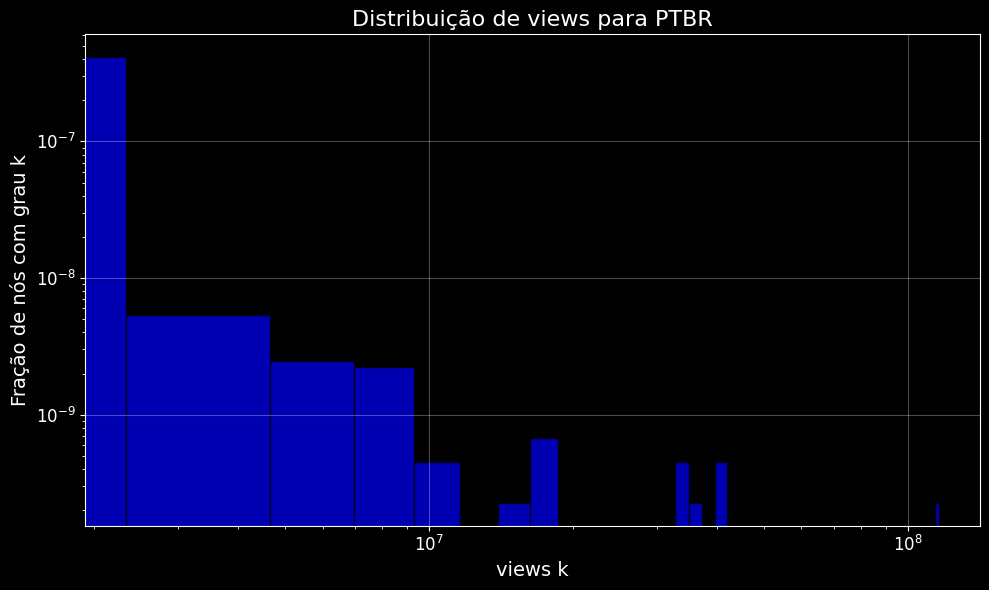

In [7]:
TwitchGraphs.plot_histogram(df = df, column_name = 'views', color = 'blue', country = country, output_dir = output_dir_hist)

### Power Law

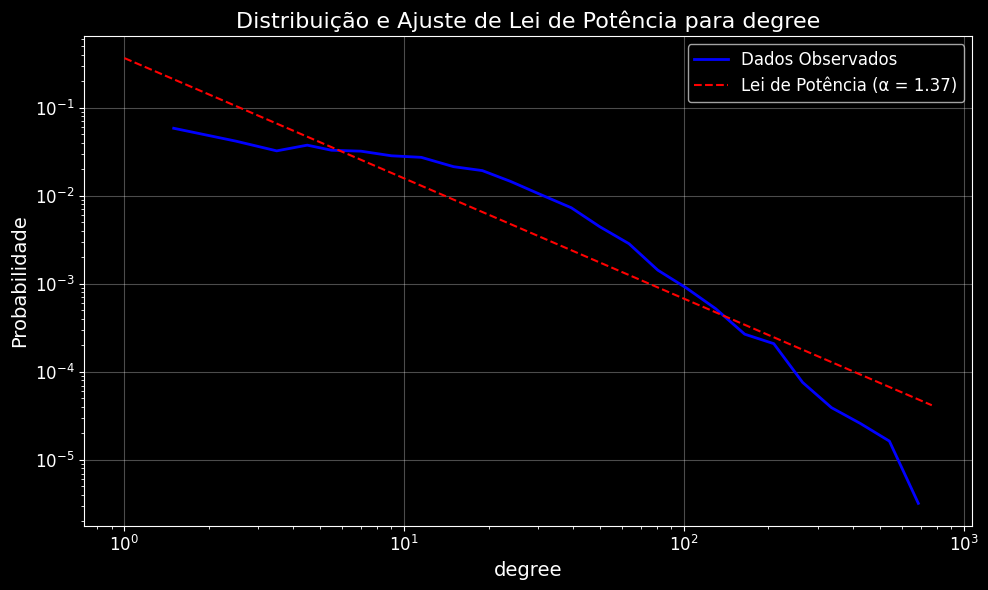

Expoente (α): 1.37
Valor mínimo (xmin): 1.0


In [8]:
alpha, xmin = TwitchGraphs.detect_power_law(df, 'degree', country, output_dir)
print(f"Expoente (α): {alpha:.2f}")
print(f"Valor mínimo (xmin): {xmin}")

Values less than or equal to 0 in data. Throwing out 0 or negative values


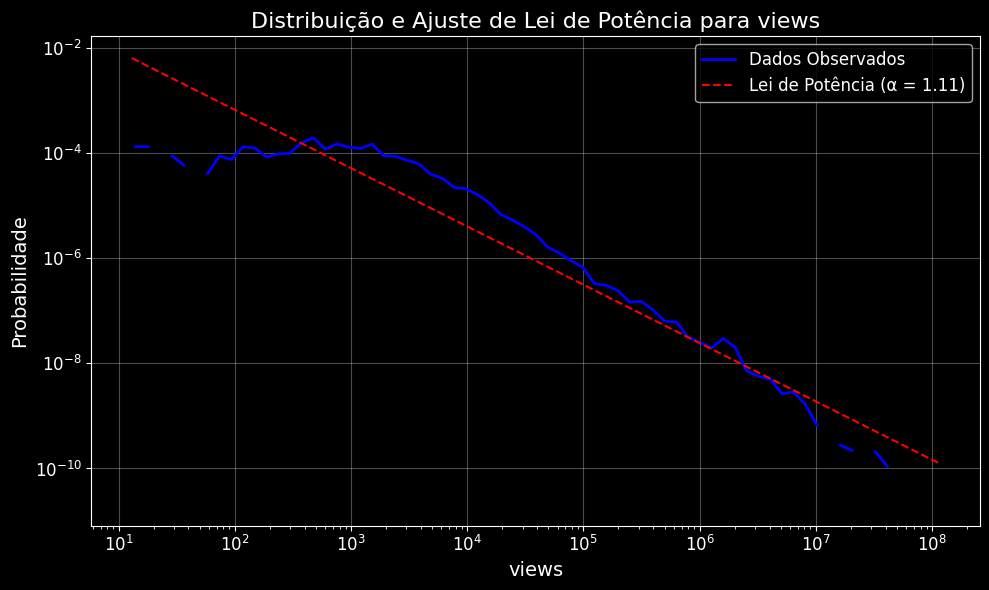

Expoente (α): 1.11
Valor mínimo (xmin): 1.0


In [9]:
alpha, xmin = TwitchGraphs.detect_power_law(df, 'views', country, output_dir)
print(f"Expoente (α): {alpha:.2f}")
print(f"Valor mínimo (xmin): {xmin}")

### PieChart das variáveis

game_name
Just Chatting                       122
League of Legends                    85
Counter-Strike                       60
Grand Theft Auto V                   56
VALORANT                             52
                                   ... 
Gears of War 3                        1
eFootball PES 2021 Season Update      1
Rush Royale                           1
Chrono Trigger                        1
Call of Duty: Infinite Warfare        1
Name: count, Length: 603, dtype: int64


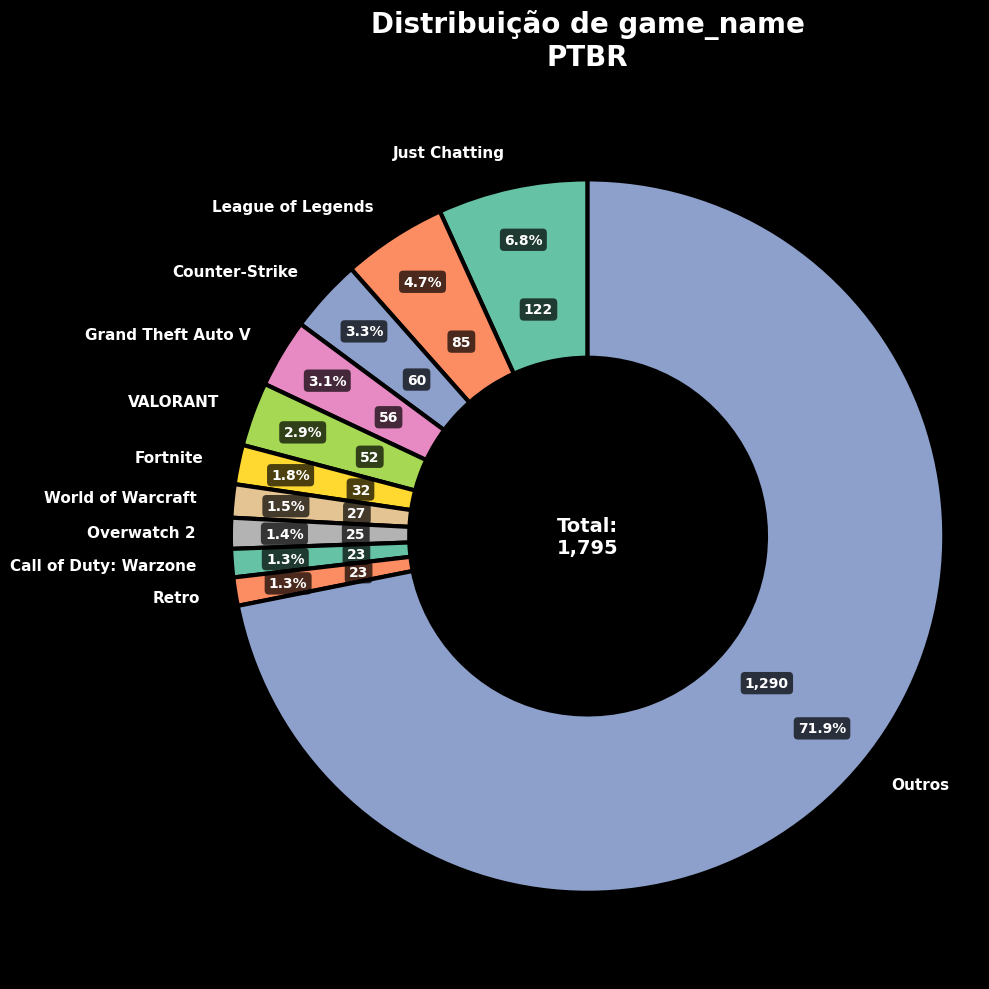

In [10]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'game_name', country = country, output_dir = output_dir)

mature
False    1251
True      661
Name: count, dtype: int64


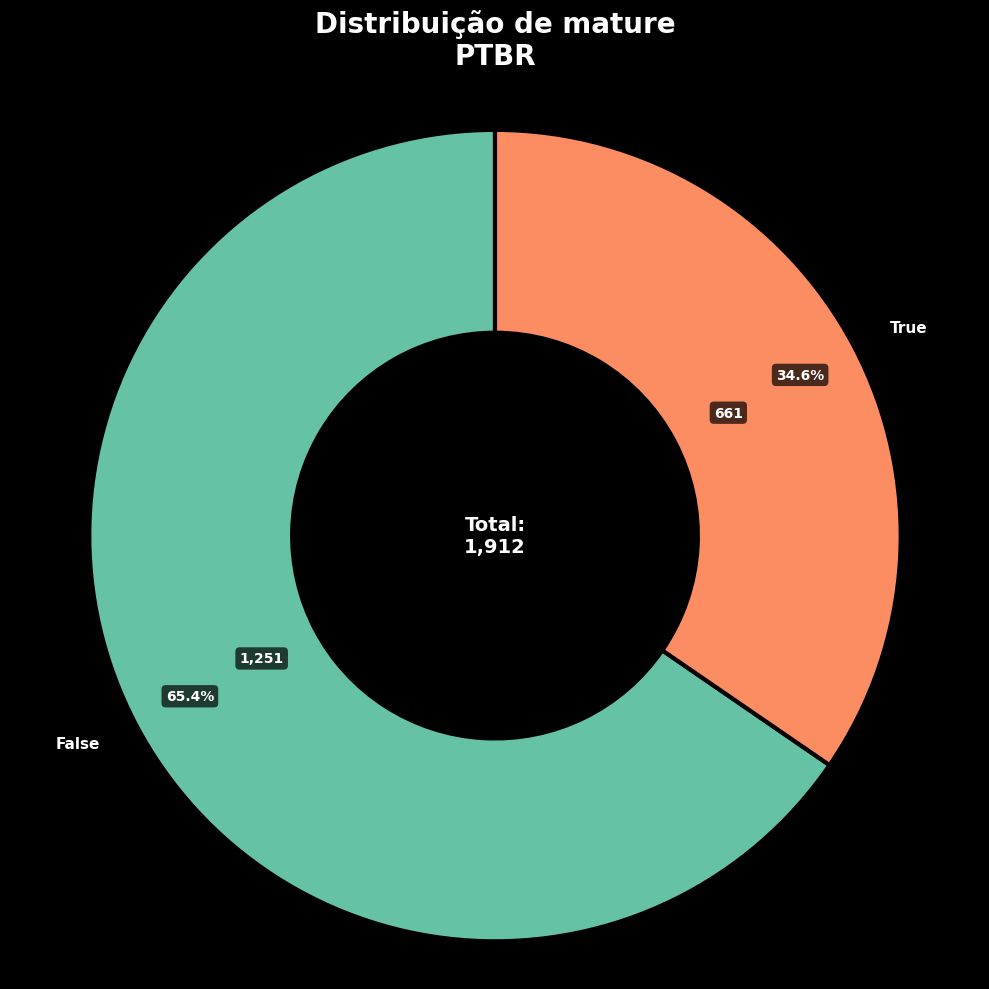

In [11]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'mature', country = country, output_dir = output_dir)

broadcaster_type
affiliate          1207
non_Streamer        397
partner             258
account_Deleted      50
Name: count, dtype: int64


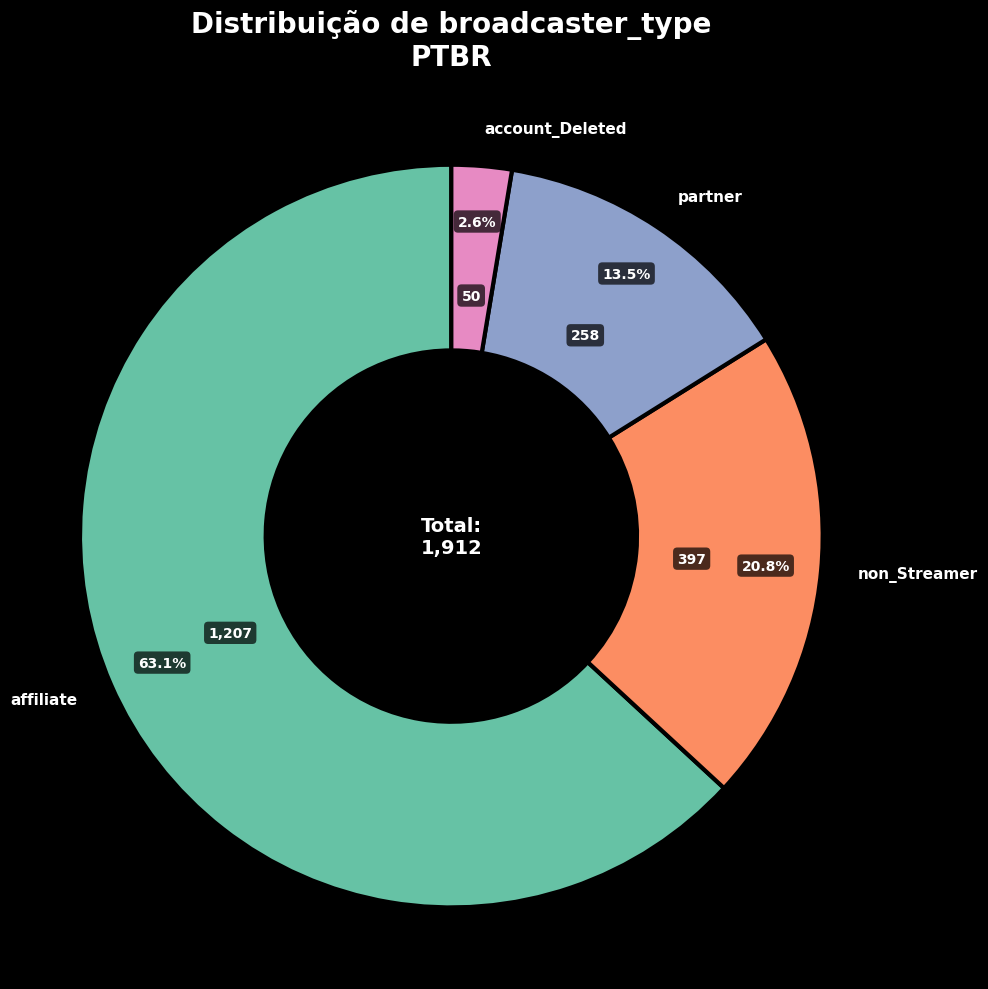

In [12]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'broadcaster_type', country = country, output_dir = output_dir)

### Comunidades

In [13]:
df

,node,degree,avg_clustering,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,clustering_coef,louvain_community,...,profile_pic,broadcaster_type,game_name,GameType,day_of_year,is_leap,days_in_year,normalized_day,sin_created_at,cos_created_at
0,1706,82,0.319895,0.042909,0.431280,0.002360,0.018123,0.001325,0.104185,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,StarCraft II,Online,168.0,False,365,2.874772,0.263665,-0.964614
1,1273,8,0.319895,0.004186,0.370421,0.000007,0.003015,0.000181,0.321429,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,NaN,Non_Content_Available,109.0,False,365,1.859134,0.958718,-0.284359
2,313,16,0.319895,0.008373,0.418345,0.000003,0.013024,0.000269,0.608333,1,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Throne and Liberty,Online,17.0,False,365,0.275427,0.271958,0.962309
3,1570,8,0.319895,0.004186,0.417249,0.000056,0.004507,0.000190,0.285714,2,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,FINAL FANTASY XIV ONLINE,Online,109.0,True,366,1.854055,0.960150,-0.279486
4,800,2,0.319895,0.001047,0.320530,0.000005,0.000322,0.000113,0.000000,6,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,Dengeki Bunko: Fighting Climax Ignition,Online,7.0,False,365,0.103285,0.103102,0.994671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1907,699,31,0.319895,0.016222,0.437400,0.000527,0.020704,0.000507,0.350538,1,...,https://static-cdn.jtvnw.net/user-default-pict...,affiliate,League of Legends,Online,259.0,True,366,4.429131,-0.960150,-0.279486
1908,109,37,0.319895,0.019362,0.435506,0.000332,0.017012,0.000580,0.339339,4,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,partner,Just Chatting,Non-Videogame,244.0,True,366,4.171623,-0.857315,-0.514793
1909,769,120,0.319895,0.062794,0.479188,0.004164,0.043742,0.001691,0.187675,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,partner,Crypto,Non-Videogame,311.0,False,365,5.336404,-0.811539,0.584298
1910,504,124,0.319895,0.064887,0.486260,0.002614,0.057477,0.001666,0.228691,4,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,partner,Just Chatting,Non-Videogame,62.0,False,365,1.050067,0.867456,0.497513


In [14]:
df['GameType'] = df['GameType'].fillna('Non_Content_Available')
df['GameType'].unique()

array(['Online', 'Non_Content_Available', 'Offline', 'Non-Videogame'],
      dtype=object)

In [15]:
df.columns

Index(['node', 'degree', 'avg_clustering', 'degree_centrality',
       'closeness_centrality', 'betweenness_centrality',
       'eigenvector_centrality', 'pagerank_centrality', 'clustering_coef',
       'louvain_community', 'lp_community', 'k_core', 'id', 'days', 'mature',
       'views', 'partner', 'new_id', 'username', 'created_at', 'profile_pic',
       'broadcaster_type', 'game_name', 'GameType', 'day_of_year', 'is_leap',
       'days_in_year', 'normalized_day', 'sin_created_at', 'cos_created_at'],
      dtype='object')

<Figure size 1500x800 with 0 Axes>

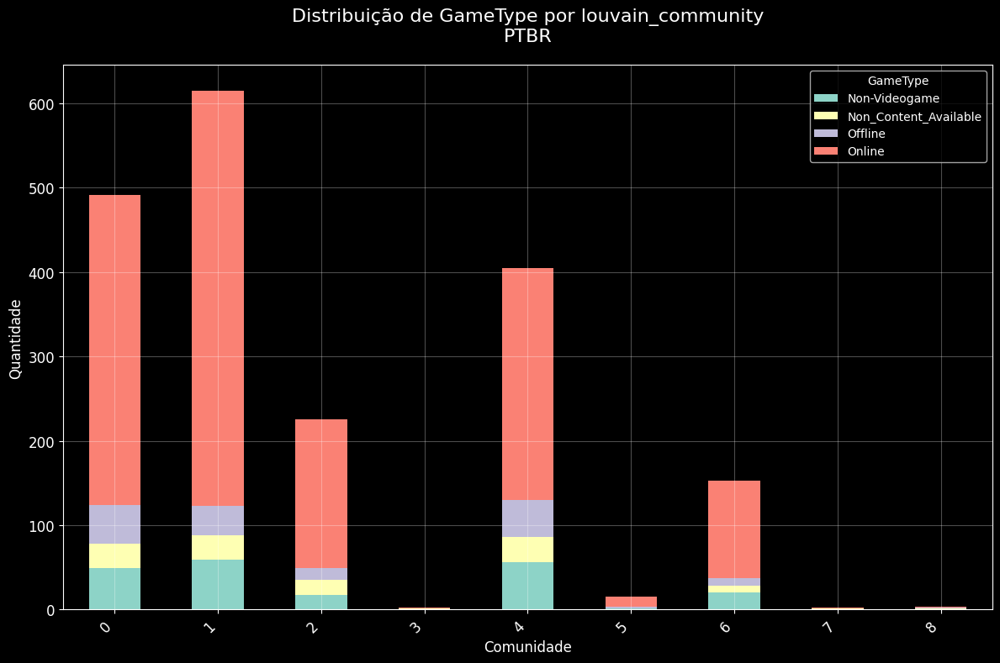

In [16]:
# Para ver distribuição de jogos por comunidade
TwitchGraphs.plot_community_distribution(df, 'GameType', 'louvain_community', country, output_dir)

<Figure size 1500x800 with 0 Axes>

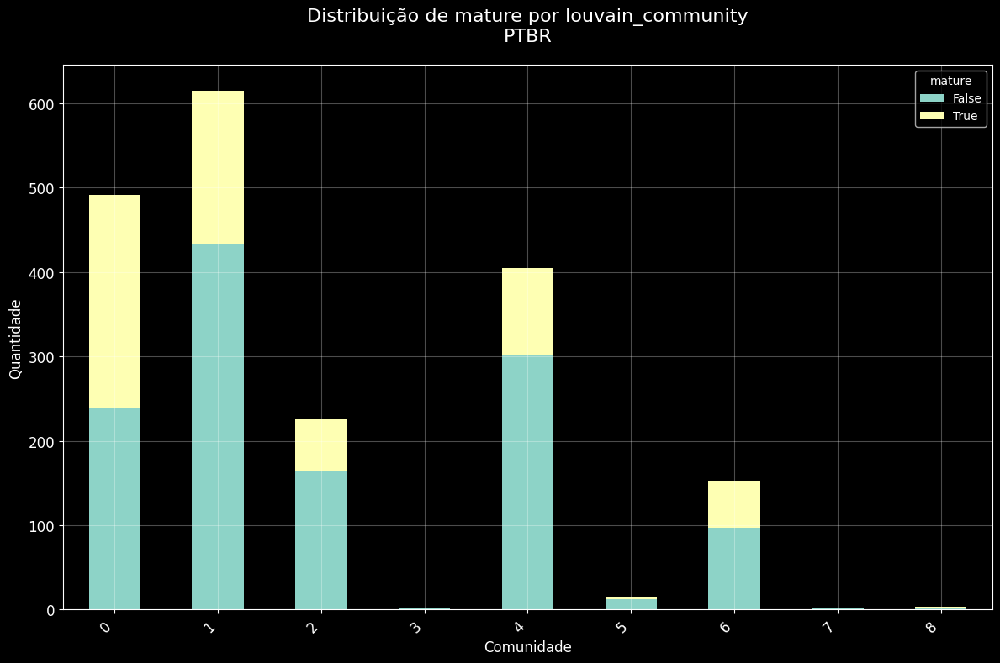

In [17]:
# Para ver distribuição de canais mature/non-mature por comunidade
TwitchGraphs.plot_community_distribution(df, 'mature', 'louvain_community', country, output_dir)

<Figure size 1500x800 with 0 Axes>

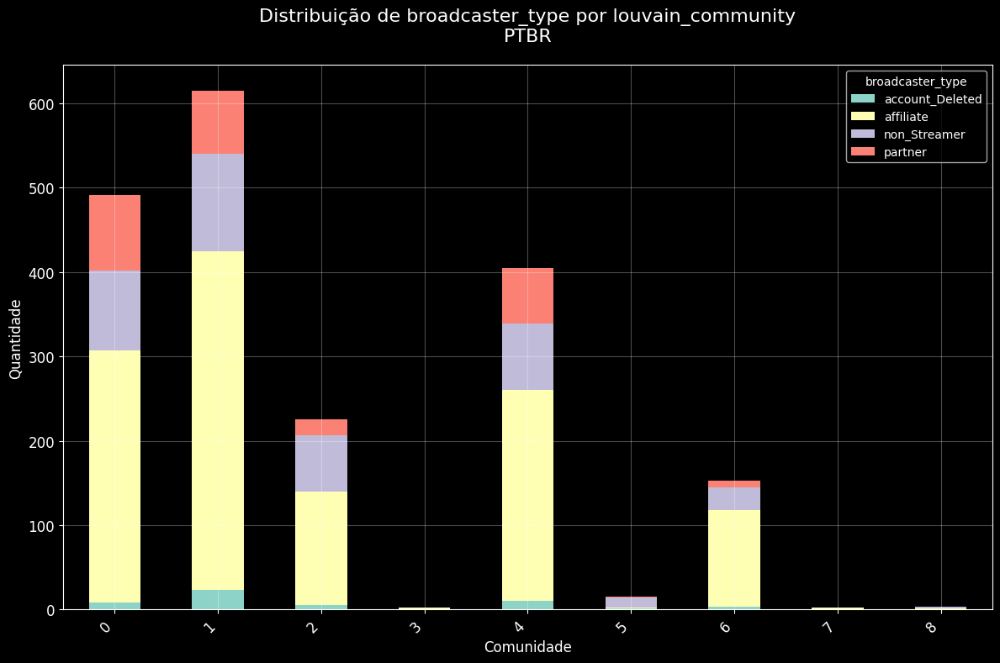

In [18]:
# Para ver distribuição de jogos por comunidade
TwitchGraphs.plot_community_distribution(df, 'broadcaster_type', 'louvain_community', country, output_dir)

In [19]:
df[df['game_name']=='ASMR']

,node,degree,avg_clustering,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,clustering_coef,louvain_community,...,profile_pic,broadcaster_type,game_name,GameType,day_of_year,is_leap,days_in_year,normalized_day,sin_created_at,cos_created_at
300,880,137,0.319895,0.07169,0.451133,0.004256,0.034132,0.002084,0.089094,0,...,NaN,account_Deleted,ASMR,Online,NaN,False,365,NaN,NaN,NaN
1337,1042,3,0.319895,0.00157,0.343705,0.000001,0.001456,0.000117,0.000000,1,...,NaN,account_Deleted,ASMR,Online,NaN,False,365,NaN,NaN,NaN


C:\Users\diogo\Desktop\ARA\Projeto\Twitch\src\visualization\TwitchGraphs.py:1072: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 1500x800 with 0 Axes>

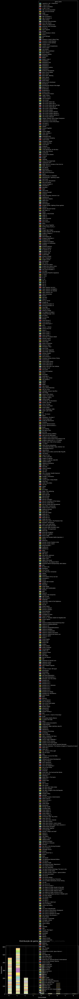

In [20]:
# Para ver distribuição de jogos por comunidade
TwitchGraphs.plot_community_distribution(df, 'game_name', 'louvain_community', country, output_dir)

In [21]:
### Date

In [22]:
# Transformar a coluna created_at em datetime
df['created_at'] = pd.to_datetime(df['created_at'], format='%Y-%m-%d')

# Data de hoje
hoje = pd.to_datetime('today')

# Recalcular a diferença em dias, exceto para os casos onde 'broadcaster_type' seja 'account_Deleted'
df['days'] = df.apply(
    lambda row: (hoje - row['created_at']).days if row['broadcaster_type'] != 'account_Deleted' else row['days'], 
    axis=1
)
df.head()

,node,degree,avg_clustering,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,clustering_coef,louvain_community,...,profile_pic,broadcaster_type,game_name,GameType,day_of_year,is_leap,days_in_year,normalized_day,sin_created_at,cos_created_at
0,1706,82,0.319895,0.042909,0.431280,0.002360,0.018123,0.001325,0.104185,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,StarCraft II,Online,168.0,False,365,2.874772,0.263665,-0.964614
1,1273,8,0.319895,0.004186,0.370421,0.000007,0.003015,0.000181,0.321429,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,NaN,Non_Content_Available,109.0,False,365,1.859134,0.958718,-0.284359
2,313,16,0.319895,0.008373,0.418345,0.000003,0.013024,0.000269,0.608333,1,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Throne and Liberty,Online,17.0,False,365,0.275427,0.271958,0.962309
3,1570,8,0.319895,0.004186,0.417249,0.000056,0.004507,0.000190,0.285714,2,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,FINAL FANTASY XIV ONLINE,Online,109.0,True,366,1.854055,0.960150,-0.279486
4,800,2,0.319895,0.001047,0.320530,0.000005,0.000322,0.000113,0.000000,6,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,Dengeki Bunko: Fighting Climax Ignition,Online,7.0,False,365,0.103285,0.103102,0.994671


In [23]:
# Função para verificar se o ano é bissexto
def is_leap_year(year):
    return (year % 4 == 0 and (year % 100 != 0 or year % 400 == 0))

# Calcular o número do dia no ano (de 1 a 365/366)
df['day_of_year'] = df['created_at'].dt.dayofyear

# Verificar o ano e ajustar o número de dias
df['is_leap'] = df['created_at'].dt.year.apply(is_leap_year)
df['days_in_year'] = df['is_leap'].apply(lambda x: 366 if x else 365)

# Normalizar para o intervalo [0, 2pi]
df['normalized_day'] = 2 * np.pi * (df['day_of_year'] - 1) / df['days_in_year']

# Aplicar as funções trigonométricas
df['sin_created_at'] = np.sin(df['normalized_day'])
df['cos_created_at'] = np.cos(df['normalized_day'])

df.head()


,node,degree,avg_clustering,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,clustering_coef,louvain_community,...,profile_pic,broadcaster_type,game_name,GameType,day_of_year,is_leap,days_in_year,normalized_day,sin_created_at,cos_created_at
0,1706,82,0.319895,0.042909,0.431280,0.002360,0.018123,0.001325,0.104185,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,StarCraft II,Online,168.0,False,365,2.874772,0.263665,-0.964614
1,1273,8,0.319895,0.004186,0.370421,0.000007,0.003015,0.000181,0.321429,0,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,NaN,Non_Content_Available,109.0,False,365,1.859134,0.958718,-0.284359
2,313,16,0.319895,0.008373,0.418345,0.000003,0.013024,0.000269,0.608333,1,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,Throne and Liberty,Online,17.0,False,365,0.275427,0.271958,0.962309
3,1570,8,0.319895,0.004186,0.417249,0.000056,0.004507,0.000190,0.285714,2,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,affiliate,FINAL FANTASY XIV ONLINE,Online,109.0,True,366,1.854055,0.960150,-0.279486
4,800,2,0.319895,0.001047,0.320530,0.000005,0.000322,0.000113,0.000000,6,...,https://static-cdn.jtvnw.net/jtv_user_pictures...,non_Streamer,Dengeki Bunko: Fighting Climax Ignition,Online,7.0,False,365,0.103285,0.103102,0.994671


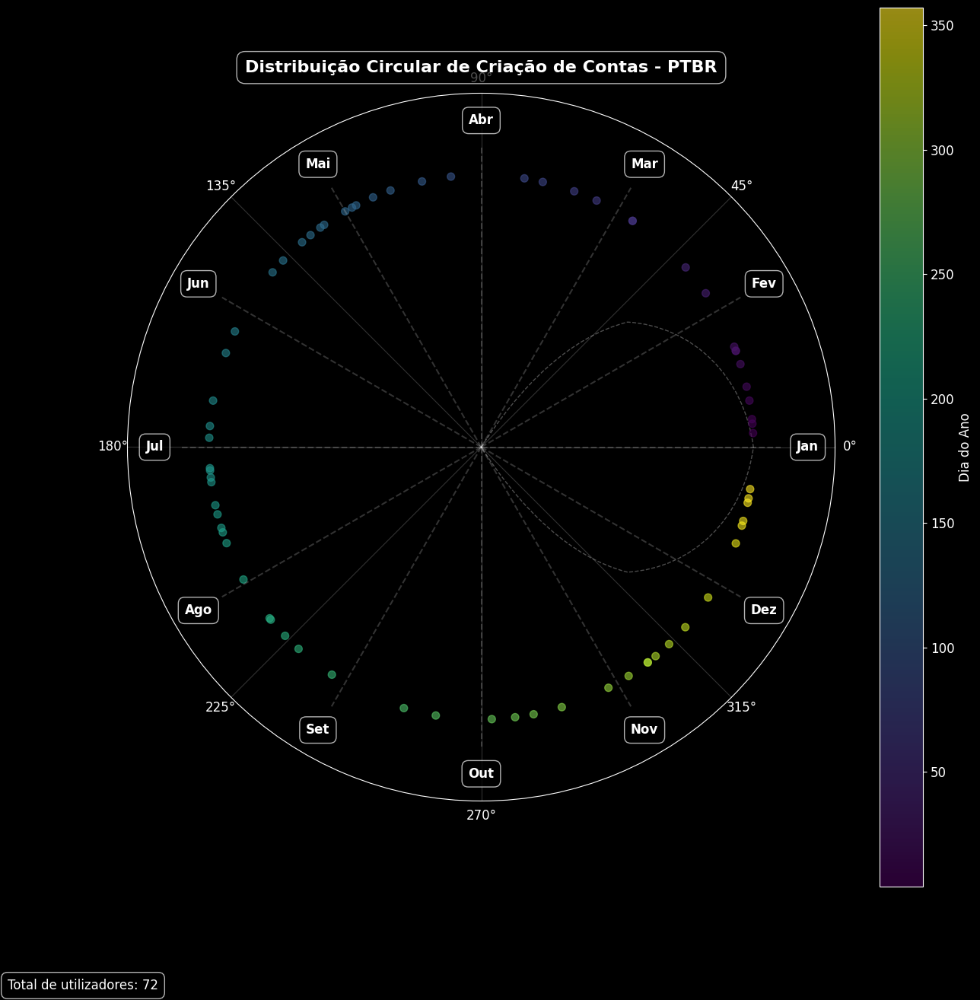

In [24]:
df1 = df.loc[df['k_core'] == 4]
TwitchGraphs.plot_circular_distribution(df1, country, output_dir)

In [25]:
df.to_csv(csv_path, index=False)